<font size="+3">**Battle of the Neighborhoods code notebook**</font> 

<font size="+2">Yasser Fuentes-Edfuf</font> 

# Introduction
This is the main document for the IBM Data Science Professional certificate capstone project. Here, all the code relative to the project will be written and explained. Accompanying this document and its datasets there is a pdf file with the final report. There will be some additional auxiliary files created during this project, such as maps. It will be stated their name and location throughout this project.

This project will allow the certificate candidates to demonstrate the knowledge learn during the eight previous courses. The topic is free and the only constraint is to use Foursquare location data (by using their API) as one of the data sets employed for the project.

# Business Understanding

## Background

Valencia is one of the principal business hub of Spain. It is located on the east of the Iberian peninsula and Spain's infrastructure stems from the city in a radial network. This makes Valencia attractive for business due to its beneficial fiscal aids from its local and regional government, the ease of travel by high-speed train, plane or boat, from and to the city and its culture of entrepreneurship. Valencia also has interesting preliminary growth indicators that project it as a valuable place to live.

Due to this, the cost of living in Valencia is higher than in other spanish cities, but the socioeconomic differences between the different neighborhoods of the city can be used to find affordable places to live.

## Problem description

Recently, a business in the city has been expanding its operations, and needs to recruit talent from outside the city (both nationally and internationally). To help their prospective employees, they want to analyze the level of living throughout the city to better recommend their new workforce where to settle. The insights derived from this analysis will give a good understanding of the socioeconomic conditions of the different neighborhoods of the city and will allow to tailor real estate recommendations to all their prospective employees independently of their salaries. 

The aim of this is to increase worker satisfaction with the company and reduce the employee churn rate and retain talent. A good worker satisfaction would also raise the customer's opinion on the company, with a possible positive effect on their sales.

The key indicators employed to analyze Valencia's neighborhoods will be:

* Population
* Average income
* Crime level
* Amenities in the neighborhood
* Real estate and rent prices (per square meter)

## Target audience

The objective is to study the socioeconomic levels of the city in order to provide housing and living expenses recommendations to new employees of the client company. The company's management also expects to understand the rationale behind the recommendations made.

The insights extracted from this analysis would also interest anyone interested in living in the city.

## Success Criteria

The project will be considered successful if a tiered list of Valencia's neighborhoods based on socioeconomic and business diversity in the neighborhood can be presented to the client to inform its prospective employees of their living choices in the city.

# Data ETL

Several datasets pertaining the city of Valencia (Spain will be used). In this document, all of them will be described. We will try to work with api requests on demand, to permit assessment of the reproducibility all data will be stored as static files. We mainly will be using official APIs from the [Sopanish Central Government](https://datos.gob.es/en/apidata) , from the spanish Instituto Nacional de Estadística, INE, ([National Statistics Institute](https://www.ine.es/dyngs/DataLab/en/manual.html?cid=45)) and from Government of Valencia's [Open Data Portal](https://www.valencia.es/dadesobertes/en/info-api/).

In [1]:
import os # system module
import glob # for operating with local files
import codecs #html file reading
import re #Regular expression library
from IPython.display import Image # for working with images
from IPython.display import Markdown as md # to print markdown in the output cells
import json #json loading
import folium #Map visualization tool
from osgeo import ogr, osr # for working with spatial data
import utm #transforming utm to latlong
import geopandas as gpd #creates geographical dataframes
import pandas as pd #creates dataframes
import numpy as np #math operations
import branca #colorcode for maps
import requests #URL requests
from selenium import webdriver #to load html map output
from webdriver_manager.chrome import ChromeDriverManager # to automanage the webdriver
from time import sleep # for managing waiting time
from bs4 import BeautifulSoup #Web scraping
import html5lib # for bs4
from sklearn import preprocessing #data preprocessing
from sklearn.cluster import KMeans #K Means clustering
from sklearn.metrics import silhouette_score #Silhouette score for k means clustering
import matplotlib.pyplot as plt #plotting
import matplotlib.cm as cm #plotting
import matplotlib.colors as colors #plotting
import seaborn as sns #plotting

In [2]:
%matplotlib inline
pd.options.mode.chained_assignment = None
# executable_path = ChromeDriverManager().install()
executable_path = 'C:\\Users\\backm\\.wdm\\drivers\\chromedriver\\win32\\91.0.4472.101\\chromedriver.exe' #Path to webdriver

SHOWMAPS = False # bool switcher to show interactive (True) static (False) maps
GHURL='' #github url for referencing interactive html maps
#Code to see all the rows and columns in a pandas dataframe:

#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.width', None)
#pd.set_option('display.max_colwidth', None)

## Geographical data

We will be using an API from [mapas.valencia.es](http://mapas.valencia.es) for [districts](http://mapas.valencia.es/lanzadera/opendata/wfs?apikey=f85c9073fabf42d08d4f68f6cc622fc2&service=wfs&VERSION=1.1.0&typename=Distritos&REQUEST=GETFEATURE) and [neighborhoods](http://mapas.valencia.es/lanzadera/opendata/Barrios/wfs?apikey=f85c9073fabf42d08d4f68f6cc622fc2&service=wfs&VERSION=1.1.0&typename=Barrios&REQUEST=GETFEATUR). Those files are in [Geography Markup Language File (.gml)](https://www.ogc.org/standards/gml) and in [EPSG:25830](https://epsg.io/25830). We will transform them into a much more convenient geojson format. We will be using geopandas, a pandas like module able to work with shapes.

We will project the shapes of the neighborhoods and districts to calculate their areas. Also, we will calculate the centroids foreach neighborhood shape.

In [3]:
# Through the API to mapas.valencia.es we requests and save the gml
# api_nei = "http://mapas.valencia.es/lanzadera/opendata/Barrios/wfs?apikey=f85c9073fabf42d08d4f68f6cc622fc2&service=wfs&VERSION=1.1.0&typename=Barrios&REQUEST=GETFEATURE"
# api_dis = "http://mapas.valencia.es/lanzadera/opendata/wfs?apikey=f85c9073fabf42d08d4f68f6cc622fc2&service=wfs&VERSION=1.1.0&typename=Distritos&REQUEST=GETFEATURE"
file_nei='data\\geodata\\valencia_neighborhoods.gml'
file_dis='data\\geodata\\valencia_districts.gml'

#We open the file with this

def records(file):  
    # generator 
    reader = ogr.Open(file)
    layer = reader.GetLayer()
    for i in range(layer.GetFeatureCount()):
        feature = layer.GetFeature(i)
        yield json.loads(feature.ExportToJson())

def gml_to_gdm(file, export=False):
    # all features of the GML file:
    features = [feat for feat in records(file)]
    # creation of the dictionary  
    my_layer = {
        "type": "FeatureCollection",
         "features": features}
    if export:
        with open(file+".geojson", 'w') as output:
            output.write(str(my_layer))

    return gpd.GeoDataFrame.from_features(my_layer, crs='EPSG:25830')
gdf_nei=gml_to_gdm(file_nei)
gdf_dis=gml_to_gdm(file_dis)

print(gdf_nei.head())
print(gdf_nei.shape)

print(gdf_dis.head())
print(gdf_dis.shape)

                                            geometry gml_id  codbarrio  \
0  POLYGON ((725499.030 4378693.390, 725477.797 4...   None          1   
1  POLYGON ((725164.733 4375392.580, 725187.044 4...   None          1   
2  POLYGON ((726040.348 4375385.446, 725995.041 4...   None          2   
3  POLYGON ((725125.352 4374458.586, 725267.352 4...   None          4   
4  POLYGON ((725831.851 4374676.082, 725933.975 4...   None          5   

        nombre  coddistbar  coddistrit  
0   BENIFARAIG         171          17  
1    BENICALAP         161          16  
2    TORREFIEL         152          15  
3       TORMOS          54           5  
4  SANT ANTONI          55           5  
(88, 6)
                                            geometry gml_id           nombre  \
0  POLYGON ((724502.540 4374248.090, 724720.039 4...   None        LA SAIDIA   
1  POLYGON ((726852.844 4373902.583, 726816.594 4...   None  EL PLA DEL REAL   
2  POLYGON ((725246.846 4373567.091, 725317.721 4...   None  

Next steps are to drop the columns we are not interested in and to rename the others.

In [4]:
gdf_nei.drop(['gml_id'],axis=1,inplace=True)
gdf_nei.columns=['geometry','nei_code','Neighborhood','disnei_code','dis_code']
gdf_nei['Neighborhood']=gdf_nei['Neighborhood'].apply(lambda x: x.title()) # Neighborhood names will be in Title Case

# District names will be in UPPER CASE
gdf_dis.drop(['gml_id',],axis=1,inplace=True) 
gdf_dis.columns=['geometry','District','dis_code']

Next is to work a little with the info we have from the 'Geometry' column:
    1. Areas for each neighborhood and district will be calculated
    2. The centroids will be calculated on each neighborhood and district
    
Notice that In order to calculate areas foreach district we transform geometry to crs and then we shape it ti Cylindrical equal-area format with {'proj':'cea'}, that preserve area measure. Afterwards, we use .area method and divide its results by 1000000 because .area method give area in square meters.

We calculate the areas by applying a [Equal Area Cylindrical](https://proj.org/operations/projections/cea.html) projection.

In [5]:
gdf_areas = gdf_nei['geometry'].to_crs({'proj':'cea'}) 
gdf_nei['nei_surface (km2)']=gdf_areas.area / 10**6
gdf_nei.head()

,geometry,nei_code,Neighborhood,disnei_code,dis_code,nei_surface (km2)
0,"POLYGON ((725499.030 4378693.390, 725477.797 4...",1,Benifaraig,171,17,1.421437
1,"POLYGON ((725164.733 4375392.580, 725187.044 4...",1,Benicalap,161,16,1.718200
2,"POLYGON ((726040.348 4375385.446, 725995.041 4...",2,Torrefiel,152,15,0.699954
3,"POLYGON ((725125.352 4374458.586, 725267.352 4...",4,Tormos,54,5,0.279823
4,"POLYGON ((725831.851 4374676.082, 725933.975 4...",5,Sant Antoni,55,5,0.249617


In [6]:
gdf_areas = gdf_dis['geometry'].to_crs({'proj':'cea'}) 
gdf_dis['dis_surface (km2)']=gdf_areas.area / 10**6
gdf_dis.head()

,geometry,District,dis_code,dis_surface (km2)
0,"POLYGON ((724502.540 4374248.090, 724720.039 4...",LA SAIDIA,5,1.942772
1,"POLYGON ((726852.844 4373902.583, 726816.594 4...",EL PLA DEL REAL,6,1.691896
2,"POLYGON ((725246.846 4373567.091, 725317.721 4...",CIUTAT VELLA,1,1.689072
3,"POLYGON ((725048.970 4373442.093, 725083.720 4...",EXTRAMURS,3,1.970731
4,"POLYGON ((726703.524 4372385.592, 726771.836 4...",L'EIXAMPLE,2,1.732328


We obtain the centroid coordinates foreach polygon in the geopandas by method gdf.centroid. This centroid returns in UTM coordinates. Later, we need those coordinates in latitude and longitude. To transform UTM to latlong we use utm package on the next adhoc function.

Doing so, we calculate the latlong foreach centroids of each neighborhood and district.

In [7]:
# ad hoc function to transform the coordinates from UTM zone 30N to lat long
def utm_to_latlon(coords, zone_number=30, zone_letter="N"):
    easting = coords[0]
    northing = coords[1]
    return utm.to_latlon(easting, northing, zone_number, zone_letter)

gdf_nei["nei_latlong"]=[utm_to_latlon(latlon) for latlon in zip(gdf_nei.centroid.x,gdf_nei.centroid.y)]
gdf_nei.head()

,geometry,nei_code,Neighborhood,disnei_code,dis_code,nei_surface (km2),nei_latlong
0,"POLYGON ((725499.030 4378693.390, 725477.797 4...",1,Benifaraig,171,17,1.421437,"(39.52564439361202, -0.38462060914942536)"
1,"POLYGON ((725164.733 4375392.580, 725187.044 4...",1,Benicalap,161,16,1.718200,"(39.49300567930434, -0.3910022863813102)"
2,"POLYGON ((726040.348 4375385.446, 725995.041 4...",2,Torrefiel,152,15,0.699954,"(39.4951980100221, -0.37693214922229545)"
3,"POLYGON ((725125.352 4374458.586, 725267.352 4...",4,Tormos,54,5,0.279823,"(39.48929683591284, -0.3793889904907553)"
4,"POLYGON ((725831.851 4374676.082, 725933.975 4...",5,Sant Antoni,55,5,0.249617,"(39.4887069481129, -0.3732265004531396)"


Exploring the case gdf_dist, we can see that "[POBLATS DEL NORD](https://es.wikipedia.org/wiki/Poblados_del_Norte)" district, with dis_code "17" has four occurrences. This means that although all of those occurrences compose one an unique district it divided in four clusters as we can see in the next image:

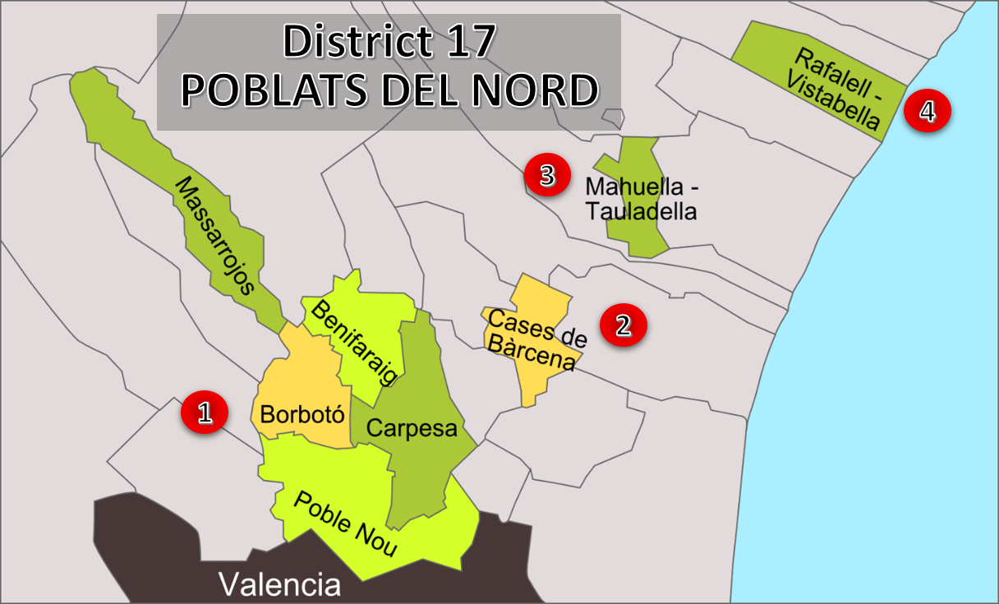

In [8]:
# loaded and displayed in this way to show the image in the pdf export
im = Image("./data/geodata/Dist17.png") 
display(im)

A work around for this is to set 3 different district 17: 
* District 17a = (1) idx=16 + (2)idx=17 idx. The addup of the (2) part can impose come displacement to the centroid to compensate most N-W part of the (1) part.
* District 17b = (3) idx=18
* District 17c = (4) idx=8

We aggregate this districts before calculate its centroids and areas.

In [9]:
gdf_dis["dis_code"]=gdf_dis.dis_code.apply(str)
gdf_dis.loc[18,"dis_code"] = "17b"
gdf_dis.loc[8,"dis_code"] = "17c"

gdf_dis=gdf_dis.append(
    {
        "geometry":gdf_dis[gdf_dis["dis_code"] == "17"].dissolve(by="dis_code")["geometry"][0],
        "District":"POBLATS DEL NORD",
        "dis_code":"17a",
    }, ignore_index=True
)

We need to assign the area for this 17a district which is equal to the sum of the prior areas, after doing so we drop those priors. Also we need to assign for districts 17a, 17b and 17c its neighborhoods.

In [10]:
gdf_dis.loc[22,"dis_surface (km2)"]=gdf_dis[gdf_dis["dis_code"] == "17"]["dis_surface (km2)"].sum()
gdf_dis = gdf_dis[~gdf_dis["dis_code"].str.match(r"\b17\b")]

gdf_nei["dis_code"]=gdf_nei.dis_code.apply(str)
gdf_nei.loc[57,"dis_code"] = "17c"
gdf_nei.loc[57,"disnei_code"] = 178
gdf_nei.loc[80,"dis_code"] = "17b"
gdf_nei.loc[gdf_nei[gdf_nei.dis_code=="17"].index.to_list(), "dis_code"]="17a"

Following the same logic we can obtain the centroid calculation of districts.

In [11]:
gdf_dis["dis_latlong"]=[utm_to_latlon(latlon) for latlon in zip(gdf_dis.centroid.x,gdf_dis.centroid.y)]
gdf_dis.head()

,geometry,District,dis_code,dis_surface (km2),dis_latlong
0,"POLYGON ((724502.540 4374248.090, 724720.039 4...",LA SAIDIA,5,1.942772,"(39.48509469562192, -0.375072056268701)"
1,"POLYGON ((726852.844 4373902.583, 726816.594 4...",EL PLA DEL REAL,6,1.691896,"(39.474593533071044, -0.3603778970955415)"
2,"POLYGON ((725246.846 4373567.091, 725317.721 4...",CIUTAT VELLA,1,1.689072,"(39.47441536841218, -0.3767595980825815)"
3,"POLYGON ((725048.970 4373442.093, 725083.720 4...",EXTRAMURS,3,1.970731,"(39.4690238029269, -0.3857795725926669)"
4,"POLYGON ((726703.524 4372385.592, 726771.836 4...",L'EIXAMPLE,2,1.732328,"(39.46411447239462, -0.37042956930844256)"


Once done, we merge both gopandas (without geometry) to new gdf_dis geopandas.

In [12]:
dis_col=list(gdf_dis.columns[1:])
nei_col=list(gdf_nei.columns)
gdf_val=pd.merge(gdf_dis[dis_col],gdf_nei[nei_col],on="dis_code", )

col_order = ['geometry','disnei_code', 'dis_code', 'District',  'dis_latlong', 'dis_surface (km2)',
       'nei_code', 'Neighborhood', 'nei_latlong',
       'nei_surface (km2)', ]
gdf_val=gdf_val[col_order]
gdf_val.set_index('disnei_code', drop=True, inplace=True)
gdf_val.sort_index(inplace=True)


gdf_val=gpd.GeoDataFrame(gdf_val , geometry = gdf_val.geometry) #here we construct the geodataframe
gdf_val.crs = gdf_nei.crs # and set its crs

gdf_val.to_excel("data\\geodata\\gdf_valencia.xlsx")

We have now all the information needed to create the geographical data frame. This will be our main dataframe (gdf_val) and contains, in the following order, the next information: 
1. Geometries of the Neighborhoods
2. District-Neighborhood code
2. District code.
3. District name.
4. District latitude and longitude
6. District surface
2. Neighborhood code.
3. Neighborhood name.
4. Neighborhood latitude and longitude
6. Neighborhood surface

As we progress in this notebook we will nurture this dataframe with different data regarding different areas (Population, Income, Real Estate, Crime, Amenities...).

But foe now, let's see some of the statistical properties of the surface of Valencia's neighborhoods and districts:

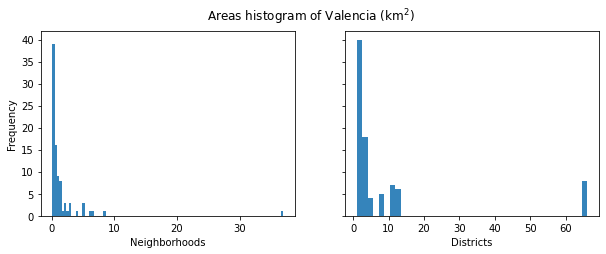

In [13]:
fig, axes = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(10,3.4))
fig.suptitle('Areas histogram of Valencia (km$^2$)')


ax_surf_nei=gdf_val['nei_surface (km2)'].plot(kind="hist", bins=100, alpha=0.9, ax=axes[0])
ax_surf_nei.set_xlabel('Neighborhoods')
ax_surf_dis=gdf_val['dis_surface (km2)'].plot(kind="hist", bins=42, alpha=0.9,ax=axes[1])
ax_surf_dis.set_xlabel('Districts')
fig.savefig('surf_disnei_hist.png',dpi=600)

In [14]:
# print(gdf_val['nei_surface (km2)'].describe())
print("The wider district is ------> {0:10} with {1:5.2f} km\u00b2".format(gdf_val.loc[gdf_val['dis_surface (km2)'].idxmax()]['District'],gdf_val['dis_surface (km2)'].max()))
print("The wider neighborhood is --> {0:10} with {1:5.2f} km\u00b2".format(", ".join(gdf_val.loc[gdf_val['nei_surface (km2)'].idxmax()][['Neighborhood','District']].to_list()),gdf_val['nei_surface (km2)'].max()))

The wider district is ------> POBLATS DEL SUD with 66.14 km²
The wider neighborhood is --> El Palmar, POBLATS DEL SUD with 36.94 km²


The mean surface of districts is of 1.55 km$^{2}$ and the median surface is 0.51 km$^{2}$. There is an outlier, "El Palmar", with a very large wild area with a surface way higher than the rest of the neighborhoods. This neighborhood comprehend more than the half of the District to which it belongs, which also is the wider district among others, "POBLATS DEL SUD".

Next, let us visualize in a map the shapes of the neighborhoods along with the centroids for each neighborhood.

In [15]:
# We define lat long of valencia for the rest of the notebook
va_lat = 39.466667;
va_lon =  -0.375000;

# This will be the main function for map cration and configuration:
def create_map(filename, colormap_field, colormap_colors, map_caption, map_fields, map_aliases):
    created_map = folium.Map(
    location=[va_lat, va_lon],
    zoom_start=12,
    tiles='https://stamen-tiles-{s}.a.ssl.fastly.net/terrain/{z}/{x}/{y}{r}.png', 
    attr='&copy; Map tiles by <a href="http://stamen.com">Stamen Design</a>, <a href="http://creativecommons.org/licenses/by/3.0">CC BY 3.0</a> &mdash; Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors')

    #Function for the color code of the map
    colormap = branca.colormap.LinearColormap(
        vmin=gdf_val[colormap_field].quantile(0.0), 
        vmax=gdf_val[colormap_field].quantile(1), 
        colors=colormap_colors,
        caption=map_caption,
    )

    tooltip = folium.features.GeoJsonTooltip(
        fields=map_fields,
        aliases=map_aliases,
        localize=True,
        sticky=False,
        labels=True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,
    )

    g = folium.GeoJson(
        gdf_val,
        style_function=lambda x: {
            "fillColor": colormap(x["properties"][colormap_field])
            if x["properties"][colormap_field] is not None
            else "transparent",
            "color": "black",
            "fillOpacity": 0.4,
        },
        tooltip=tooltip
    ).add_to(created_map)

    colormap.add_to(created_map)
    
    created_map.save(filename+".html")
    co = webdriver.ChromeOptions()
    co.add_argument("--headless")
    driver=webdriver.Chrome(executable_path=executable_path, options=co)
    driver.get("file://"+os.getcwd()+"//"+filename+".html")
    sleep(0.5)
    driver.save_screenshot(filename+".png")
    driver.close()
    return created_map

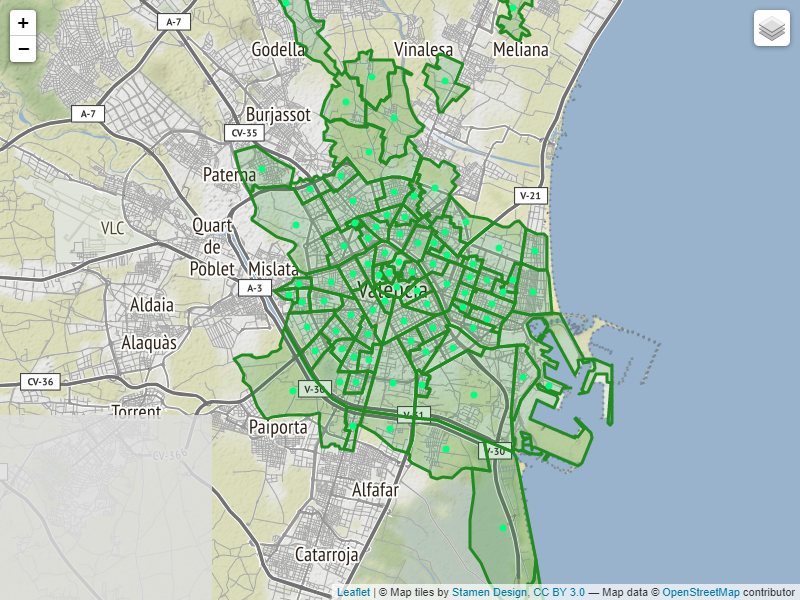

[Interactive map](valencia_map.html)

In [16]:
# First map we are creating is kind special, so we make it manually:
v_map=folium.Map(
    location=[va_lat, va_lon],
    zoom_start=12,
    tiles='https://stamen-tiles-{s}.a.ssl.fastly.net/terrain/{z}/{x}/{y}{r}.png', 
    attr='&copy; Map tiles by <a href="http://stamen.com">Stamen Design</a>, <a href="http://creativecommons.org/licenses/by/3.0">CC BY 3.0</a> &mdash; Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributor')

# Style definition
style1 = {'fillColor': '#228B22', 'color': '#228B22'}
style2 = {'fillColor': '#00FFFFFF', 'color': '#00FFFFFF'}


#Add a tooltip to all the neighborhoods in the geojson file
folium.GeoJson(data=gdf_val,
               name='Neighborhoods of Valencia',
               style_function=lambda x:style1,
               tooltip=folium.features.GeoJsonTooltip(
                   fields=['Neighborhood',"District"],
                   aliases=['Neighborhood: ', 'District: '],
                   labels=True,
                   sticky=True,
                   toLocaleString=True,
               ),
              ).add_to(v_map)

#Add a marker to the centroid of each neighborhood.
for index, row in gdf_val.iterrows(): 
    folium.CircleMarker(location=row.nei_latlong,
                        radius=2,
                        color='springgreen',
                        fill_color='springgreen',
                        fill_opacity=1,
                       ).add_to(v_map)


gdf_dis.crs = gdf_val.crs
folium.GeoJson(data=gdf_dis,
               name='Districts of Valencia',
               show=False,
               style_function=lambda x:style2,
               tooltip=folium.features.GeoJsonTooltip(
                   fields=['District'],
                   aliases=['District: '],
                   labels=True,
                   sticky=True,
                   toLocaleString=True,
               ),
              ).add_to(v_map)

folium.LayerControl().add_to(v_map)

# #Jupyter only needs to call the variable of the map to render it (m), but in 
# #iPython we need to generate the map in a html like this:  
filename = "valencia_map"
v_map.save(filename+".html")

co = webdriver.ChromeOptions()
co.add_argument("--headless")
driver=webdriver.Chrome(executable_path=executable_path, options=co)
driver.get("file://"+os.getcwd()+"//valencia_map.html")
dummy = driver.save_screenshot(filename+".png")
driver.close()

if SHOWMAPS == True:
    display(v_map)
else:
    im = Image(filename+".png")
    display(im)
       
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

## Population data   

Population data for the city of Valencia is taken from the data bank of the City Council of Valencia, [here](https://www.valencia.es/dadesobertes/en/dataset/?id=illa-de-cases-cadastrals-amb-dades-de-poblacio). The information extracted is the number of inhabitants per neighborhood block. So, we need to aggregate the population by Neighborhood. We start fetching and transforming this population area.

In [17]:
file_dis='data\\population\\valencia_population.geojson'

# Snipet for fetching and saving population data from the api
# url_pop = 'http://mapas.valencia.es/lanzadera/opendata/Manzanas_pob/JSON?srsName=EPSG:4326'
# resp = requests.get(url_pop)
# gpd_population = gpd.read_file(resp.text)
# gpd_population.to_file(file_dis, driver='GeoJSON')

gpd_population = gpd.read_file(file_dis) # read the data
gpd_population.to_crs("EPSG:25830", inplace=True) # Apply of the correct crs we are working with
gpd_population["pob_total"]=gpd_population["pob_total"].apply(lambda x: 0 if x == "" else int(x)) # setting up pop data

Then we aggregate the population. We iterate over each Neighborhood of Valencia and sum the population of the blocks that are within it by means of within.

In [18]:
pops = [] # Initialization of var where we will save the population foreach neigborhood
for row in gdf_val.itertuples():
    pops.append(gpd_population[gpd_population.within(row.geometry)]["pob_total"].sum()) 
    # print("Neiborhood: {0} -> population: {1}".format(row.Neighborhood, gpd_population[gpd_population.within(row.geometry)]["pob_total"].sum()))
gdf_val["Population"] = pops

Let us perform an exploratory analysis of the neighborhood's population.

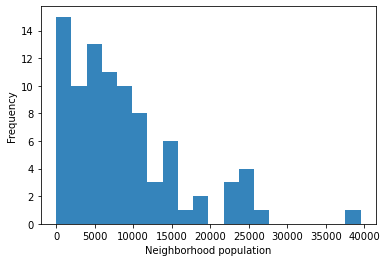

In [19]:
ax_pop=gdf_val['Population'].plot.hist(bins=20, alpha=0.9)
ax_pop.set_xlabel('Neighborhood population')
fig= ax_pop.get_figure()
fig.savefig('pop_hist.png',dpi=300)

In [20]:
gdf_val['Population'].describe()

count       88.000000
mean      8809.750000
std       7492.920431
min          0.000000
25%       3584.750000
50%       6577.500000
75%      11749.250000
max      39506.000000
Name: Population, dtype: float64

We found a Neighborhood without population. "[Rafalell-Vistabella (SP)"](https://es.wikipedia.org/wiki/Marjal_de_Rafalell_y_Vistabella) Neighborhood is a non-developable marsh. Then, for the purpose of this analysis we delete if from the dataframe.

In [21]:
gdf_val = gdf_val[gdf_val["Population"] > 0]
gdf_val['Population'].describe()

count       87.000000
mean      8911.011494
std       7475.550644
min         30.000000
25%       3625.000000
50%       6590.000000
75%      11755.500000
max      39506.000000
Name: Population, dtype: float64

In the case of the population values per neighborhood the data is more grouped than the surface of the neighborhoods. 75% of the neighborhoods have a population less than approximately 12000 people, with the most populous neighborhood housing around 40000 people. There is a notable 35% of difference between mean and median, in fact the standard deviation is about the same as the mean.

Now, the population for each neighborhood will be visualized in a map.

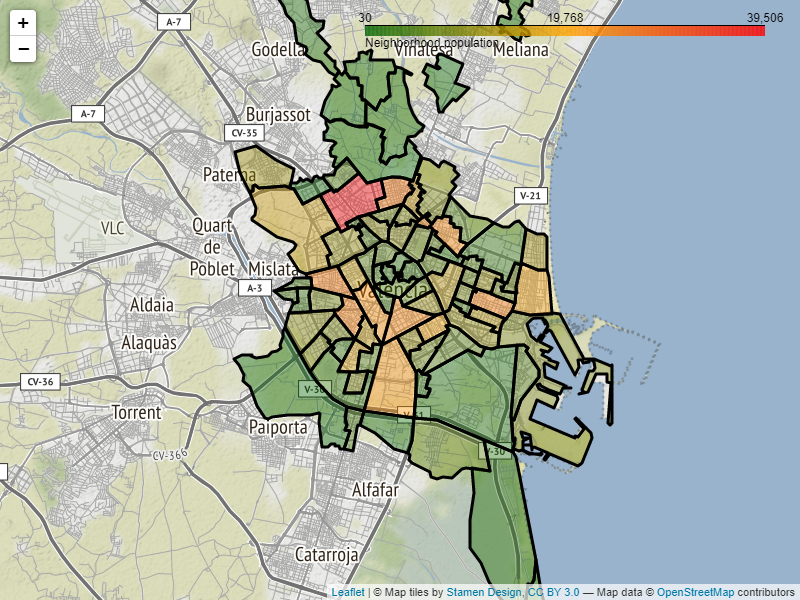

[Interactive map](valencia_pop.html)

In [22]:
filename = "valencia_pop"
colormap_field = 'Population'
colormap_colors=['darkgreen','orange','red']
map_caption='Neighborhood population'
map_fields=['Neighborhood', 'District', 'Population']
map_aliases=['Neighborhood: ', 'District: ', 'Population: ']

dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

What we want is, in fact, the density of population. So we divide the Population by the Area of each Neighborhood and plot that data.

In [23]:
gdf_val["pop_density"]=gdf_val.apply(lambda row: row['Population']/(row["nei_surface (km2)"]), axis=1)
gdf_val["pop_density"].describe()

count       87.000000
mean     17852.531144
std      13340.337571
min         18.622911
25%       6436.578483
50%      16474.082167
75%      29541.725937
max      47757.285630
Name: pop_density, dtype: float64

Here we can get a better insight of the populated areas. Now we can see that the mean and the median densities are around the same on 17000 inhabitants per square meter. Lets see this data on the map:

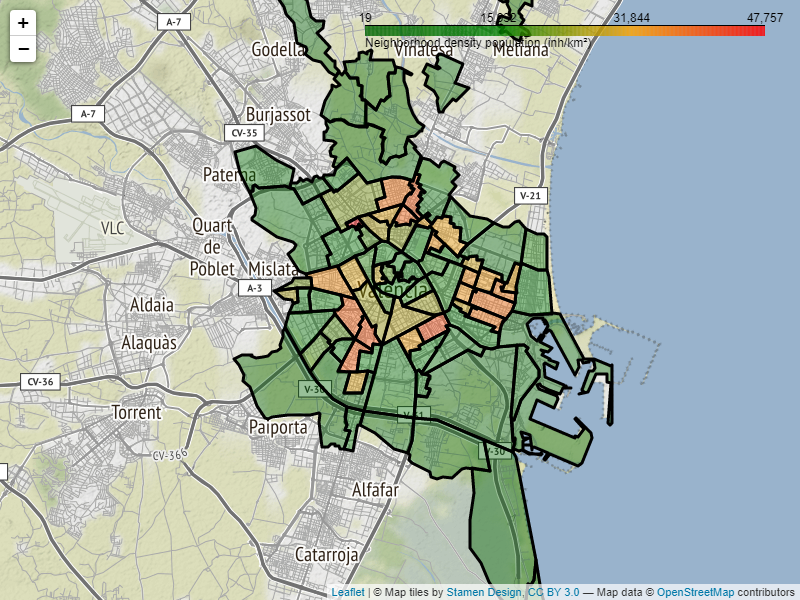

[Interactive map](valencia_density_pop.html)

In [24]:
filename="valencia_density_pop"
colormap_field = 'pop_density'
colormap_colors=['darkgreen','green','orange','red']
map_caption='Neighborhood density population (inh/km²)'
map_fields=['Neighborhood', 'District', 'pop_density']
map_aliases=['Neighborhood: ', 'District: ', 'Population density: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

## Income data

Last data corresponding to the mean gross income per person available is for 2018, it was taken from Spain's Instituto Nacional de Estadística, INE, ([National Statistics Institute](https://www.ine.es/experimental/atlas/exp_atlas_tab.htm)). The downloaded file is a json with all the district data for the city of Valencia. This data was taken at a Neighborhood level, but we need to transform it a little bit before assign it to our dataframe. 

In [25]:
file_inc='data\\income\\valencia_income.json'

# Snipet for fetching and saving income data from de api
# url_inc = "https://servicios.ine.es/wstempus/js/ES/DATOS_TABLA/31250?nult=1"
# resp = requests.get(url_inc)
# raw_inc = json.loads(resp.text)
# with open(file_inc, "w") as outfile:
#     json.dump(raw_inc, outfile)

# Opening JSON file
with open(file_inc, 'r') as openfile:
    # Reading from json file
    raw_inc = json.load(openfile)

Next is to parse the json file in order to create a dictionary referring district-subdistrict with income:

1. First we iterate over all the raw data 
2. then we just select _the mean gross income per person_. 
3. We take only the rows with relevant data 
4. and from those only the corresponding for neighborhood ones. 
5. We split the line taking only last numbers:
6. the ones referring to a district,
7. the ones referring to a neighborhood.
8. In our dataframe, there are not subdistrict above "8",
9. so we can compose disnei code (district-neighborhood) in the same manner our dataframe has.
10. Once here we save the income value 
11. into the dictionary using the the corresponding disnei code.

In [26]:
# Creating a dictionary of just the Valencia Neighborhoods with its mean gross income per person
dis_inc = {}
for element in raw_inc: # 1
    if "Renta bruta media por persona." in element["Nombre"]: # 2 
        dis = element["Nombre"].split(". Dato base")[0].lower() # 3
        if "valència sección" in dis: # 4
            dis=dis.split()[-1] # 5
            d_code = int(dis[:2]) # 6
            n_code = int(dis[2:]) # 7
            if n_code < 9: # 8
                disnei = int(str(d_code)+str(n_code)) # 9
                try:
                    inc = int(element["Data"][0]["Valor"]) # 10
                except:
        #             print(element)
                    inc = 0
                if disnei in dis_inc.keys():
                    print("{0}: {1}".format(disnei,element["Data"][0]["Valor"]))
                    inc = (inc+dis_inc[disnei])/2
                dis_inc[disnei]=inc # 11

Now we can explore and save the dis_inc data which intersects with the disnei codes our dataframe has, and then assign that income to that neighborhood.

In [27]:
disnei_inc_data=set(gdf_val.index.to_list()).intersection(set(dis_inc.keys()))
for disnei in disnei_inc_data:
    gdf_val.loc[disnei,"Income"]=dis_inc[disnei]

There are some missing values for some neighborhoods. Foreach of those neighborhoods with missing income data we calculate the median income value of its district. To doing so, we calculate those means by grouping by "District".

In [28]:
inc_means = gdf_val[~gdf_val["Income"].isna()].groupby("District")["Income"].median()
no_inc_idx = gdf_val[gdf_val["Income"].isna()].index
for idx in no_inc_idx:
    gdf_val.loc[idx,"Income"] = inc_means.loc[gdf_val.loc[idx,"District"]]

A map will be generated to visualize the income data:

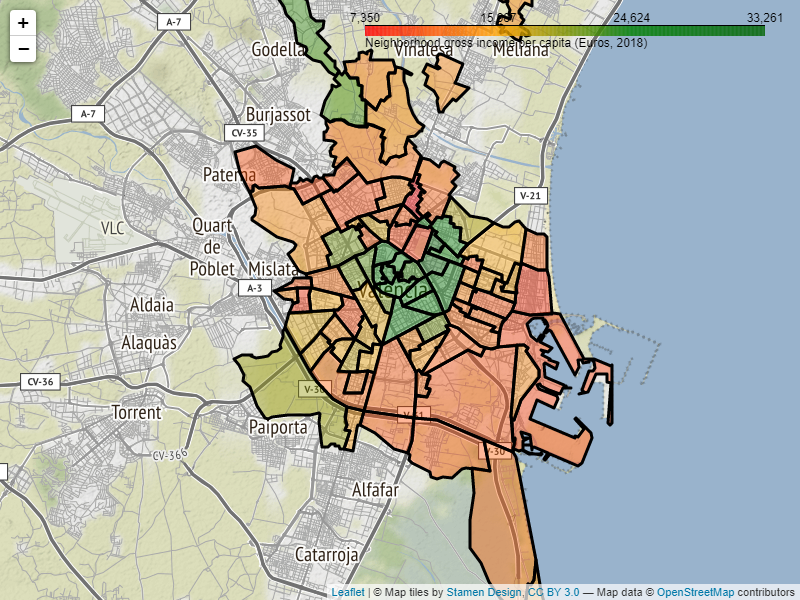

[Interactive map](valencia_inc.html)

In [29]:
filename="valencia_inc"
colormap_field = 'Income'
colormap_colors=['red','orange','green','darkgreen']
map_caption='Neighborhood gross income per capita (Euros, 2018)'
map_fields=['Neighborhood','District', 'Income']
map_aliases=['Neighborhood: ','District: ', 'Income: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

In the map it can be seen a central-radial income divide, with the neighborhoods in the center have more average income per person. 

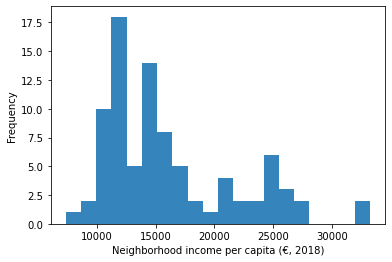

In [30]:
ax_inc=gdf_val['Income'].plot.hist(bins=20, alpha=0.9)
ax_inc.set_xlabel('Neighborhood income per capita (€, 2018)')
fig= ax_inc.get_figure()
fig.savefig('inc_hist.png',dpi=300)

In [31]:
gdf_val['Income'].describe()

count       87.000000
mean     16160.120690
std       5652.829432
min       7350.000000
25%      12092.000000
50%      14109.000000
75%      19189.000000
max      33261.000000
Name: Income, dtype: float64

The income per neighborhood is shown in the histogram above. The mean value is around 16200 €, and the median value is 14190 €. There is a clear trend of lower income frequency as the average income per person goes up.

## Real Estate data

The information for the average price of the square meter at a neighborhood level will be scraped from [Idealista data website](https://www.idealista.com/sala-de-prensa/informes-precio-vivienda/venta/comunitat-valenciana/valencia-valencia/valencia/). Idealista is one of the biggest real estate agencies in Spain, and they have a very interesting data analysis and visualization available to the public. 

The html for both selling and renting real estate are manually downloaded to scrap them locally.

In [32]:
rent_path='.\\data\\real_state\\rent\\'
sale_path='.\\data\\real_state\\sale\\'

def extract_real_state_values(html_file):
    with open(html_file, 'r',  encoding="utf8") as openfile:
        # Reading from html file
        soup = BeautifulSoup(openfile.read(),"html5lib")
    dict_values={}
    for tr in soup.tbody.find_all("tr")[1:]:
        tds = tr.find_all("td")
        dict_values[tds[0].text] = float(tds[1].text.split()[0].replace(",",""))
    return dict_values

dict_rent={}
print("Processing real state rent...")
for file in glob.glob(rent_path+"*.html"):
    dict_rent = dict_rent | extract_real_state_values(file)
    print("{0} processed.".format(file.split("\\")[-1]))
print("Done.\n")

dict_sale={}
print("Processing real state sale...")
for file in glob.glob(sale_path+"*.html"):
    dict_sale = dict_sale | extract_real_state_values(file)
    print("{0} processed.".format(file.split("\\")[-1]))
print("Done.\n")

Processing real state rent...
algiros_rent.html processed.
benicalap_rent.html processed.
benimaclet_rent.html processed.
camins-al-grau_rent.html processed.
campanar_rent.html processed.
ciutat-vella_rent.html processed.
el-pla-del-real_rent.html processed.
extramurs_rent.html processed.
jesus_rent.html processed.
la-saidia_rent.html processed.
leixample_rent.html processed.
lolivereta_rent.html processed.
patraix_rent.html processed.
poblats-maritims_rent.html processed.
quatre-carreres_rent.html processed.
rascanya_rent.html processed.
Done.

Processing real state sale...
algiros_sale.html processed.
benicalap_sale.html processed.
benimaclet_sale.html processed.
camins-al-grau_sale.html processed.
campanar_sale.html processed.
ciutat-vella_sale.html processed.
el-pla-del-real_sale.html processed.
extramurs_sale.html processed.
jesus_sale.html processed.
la-saidia_sale.html processed.
leixample_sale.html processed.
lolivereta_sale.html processed.
patraix_sale.html processed.
poblats-

Next step is to clean the dictionaries that we just created. After data exploration two steps are needed:

1. Idealista subdivided some neighborhoods. We calculate the mean for them:
 1. Between "Banicalap" and "Now Benicalap"
 2. Between "Campanar" and "Now Campanar"
2. We clean the dictionary keys to match neighborhoods names in our dataframe 

In [33]:
# Subdivided neighborhoods
dict_rent["Benicalap"] = "{0:0.1f}".format((float(dict_rent["Benicalap"])+float(dict_rent["Nou Benicalap"]))/2)
dict_rent.pop("Nou Benicalap")
dict_rent["Campanar"] = "{0:0.1f}".format((float(dict_rent["Campanar"])+float(dict_rent["Nou Campanar"]))/2)
dict_rent.pop("Nou Campanar")

dict_sale["Benicalap"] = "{0:0.1f}".format((float(dict_sale["Benicalap"])+float(dict_sale["Nou Benicalap"]))/2)
dict_sale.pop("Nou Benicalap")
dict_sale["Campanar"] = "{0:0.1f}".format((float(dict_sale["Campanar"])+float(dict_sale["Nou Campanar"]))/2)
dict_sale.pop("Nou Campanar")

# Name cleaning

dict_rename = {'Beteró':'Betero',
 'Camí Fondo':'Cami Fondo',
 'Camí de Vera':'Cami De Vera',
 'Ciutat Jardí':'Ciutat Jardi',
 'Ciutat Universitària':'Ciutat Universitaria',
 'Ciutat de les Arts i de les Ciencies':'Ciutat De Les Arts I De Les Ciencies',
 'El Botànic':'El Botanic',
 'El Cabanyal-El Canyamelar':'Cabanyal-Canyamelar',
 'El Pla del Remei':'El Pla Del Remei',
 'Exposició':'Exposicio',
 'Gran Vía':'La Gran Via',
 "L'Hort de Senabre":"L'Hort De Senabre",
 'La Creu del Grau':'La Creu Del Grau',
 'Playa de la Malvarrosa':'La Malva-Rosa',
 'Sant Llorenç':'Sant Llorens',
 'Sant Marcellí':'Sant Marcel.Li',
 'Vara de Quart':'Vara De Quart',
 'Camí Reial':'Cami Real',
 'Barrio de Favara':'Favara'}


dict_rent_clean = {}
for k, v in dict_rent.items():
    v=float(v)
    if k in dict_rename.keys():
        dict_rent_clean[dict_rename[k]]=v
    else:
        dict_rent_clean[k]=v

        
dict_sale_clean = {}
for k, v in dict_sale.items():
    v=float(v)
    if k in dict_rename.keys():
        dict_sale_clean[dict_rename[k]]=v
    else:
        dict_sale_clean[k]=v

Now we can assign rent and sale values to the neighborhoods. Following the logic for income data, in those neighborhoods without rent or sale values we will assign the median of the district.

In [34]:
gdf_val=gdf_val.merge(pd.DataFrame.from_dict({"Neighborhood":dict_sale_clean.keys(), "Sale":dict_sale_clean.values()}), on="Neighborhood", how="outer")
gdf_val=gdf_val.merge(pd.DataFrame.from_dict({"Neighborhood":dict_rent_clean.keys(), "Rent":dict_rent_clean.values()}), on="Neighborhood", how="outer")

# Processing sales
sale_means = gdf_val[~gdf_val["Sale"].isna()].groupby("District")["Sale"].median()

for nodata in list(set(gdf_val.District.unique()) - set(sale_means.index)): # If there is any Disctrict without sale data, we set it to the Valencia median
    sale_means=sale_means.append(pd.Series(1839, index=[nodata]))

no_sale_idx = gdf_val[gdf_val["Sale"].isna()].index
for idx in no_sale_idx:
    gdf_val.loc[idx,"Sale"] = sale_means.loc[gdf_val.loc[idx,"District"]]
    
# Processing rents
rent_means = gdf_val[~gdf_val["Rent"].isna()].groupby("District")["Rent"].median()

for nodata in list(set(gdf_val.District.unique()) - set(rent_means.index)): # If there is any Disctrict without rent data, we set it to the Valencia median
    rent_means=rent_means.append(pd.Series(8.8, index=[nodata]))

no_rent_idx = gdf_val[gdf_val["Rent"].isna()].index
for idx in no_rent_idx:
    gdf_val.loc[idx,"Rent"] = rent_means.loc[gdf_val.loc[idx,"District"]]

Let us visualize in a map the prices for rent and sell taken from the Idealista webpage:

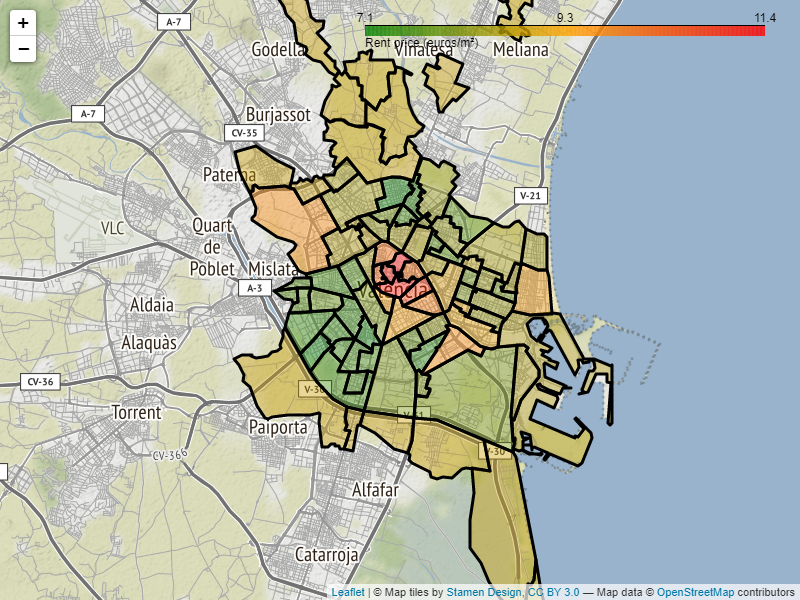

[Interactive map](valencia_ren.html)

In [35]:
filename = "valencia_ren"
colormap_field = 'Rent'
colormap_colors=['green','orange','red']
map_caption="Rent price (euros/m²)"
map_fields=['Neighborhood','District', 'Rent']
map_aliases=['Neighborhood: ','District: ', 'Rent: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

Rent data shown in the map shows that the neighborhoods in the outskirts of the city are cheaper than the neighborhoods near downtown. Prices in the north part of the city are higher than those in the south, following the north-south income divide explained in the income section.

Lets see the distribution of selling prices:

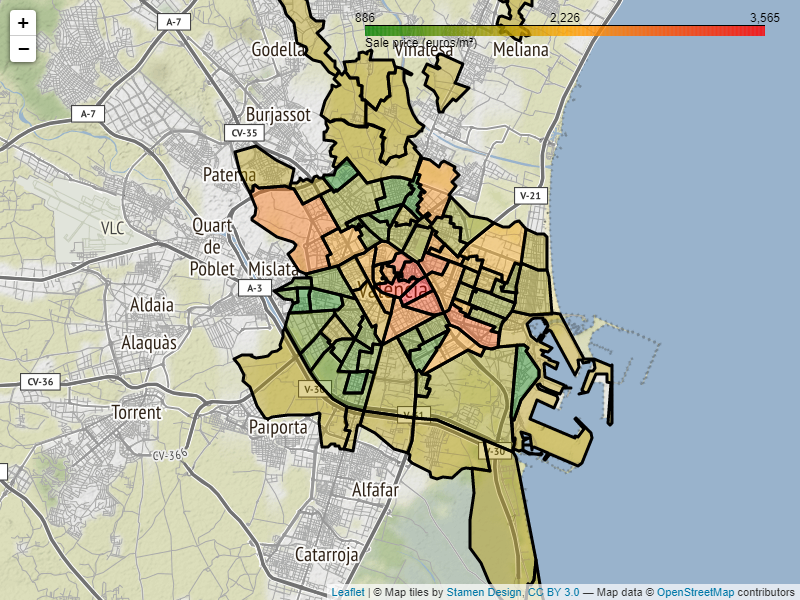

[Interactive map](valencia_sale.html)

In [36]:
filename="valencia_sale"
colormap_field = 'Sale'
colormap_colors=['green','orange','red']
map_caption="Sale price (euros/m²)"
map_fields=['Neighborhood','District', 'Sale']
map_aliases=['Neighborhood: ','District: ', 'Sale: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

The price trend in the case of real estate for sell is the same as in the case of rent prices. This implies a strong positive correlation, as we will see later.

## Crime data

Crime data for 2019 is taken from a statistical review of the city of Valencia from the Valencia council [here (SP)](https://www.valencia.es/cas/estadistica/anuario-estadistica?capitulo=11). The sheet "4.4" contains the crime data disaggregated at district level. So we fetch the file, load it, and just take the corresponding column ("Seguridad Ciudadana", police actions crime) foreach district. 

We process the date as follows:

1. We take just the districts names and its crime data
2. We rename the columns
3. Some crime value is not assign to any district, we save it for distribute it among the districts
4. We remove this not assigned crime data from the dataframe
5. Then we distribute not assigned crime among districts percentually

In [37]:
crime_path='.\\data\\crime\\crimedata2019.xlsx'

# Snipet for fetching and saving crime data from de web
# url_crime = "https://www.valencia.es/estadistica/Anuario/2020/XLS_Cast/Cap11.xlsx"
# resp=requests.get(crime_url)
# resp = requests.get(url_crime)
# with open(crime_path, "wb") as outfile:
#    outfile.write(resp.content)

pd_crime=pd.read_excel(crime_path, sheet_name="4.4",header=2)[["Unnamed: 0","Seguridad Ciudadana"]][1:-1] # 1
pd_crime.columns = ["District", "dis_crime"] # 2
crime_to_assign = pd_crime.loc[20, "dis_crime"] # 3
pd_crime=pd_crime[:-1] # 4
pd_crime.dis_crime = pd_crime.dis_crime+(pd_crime.dis_crime/pd_crime.dis_crime.sum())*crime_to_assign

Luckily enough, the frame is ordered by index in the same order than the district code, so we can merge it directly with our main dataframe. However, by means of usability, we previously divided our 17th District Code into 17a and 17b (also 17c, but that Neighborhood was removed as it was a marsh area). In order to merge crime data we will create an integer dummy column on gdf_val.

In [38]:
print("Main dataset district codes:\n %s" % gdf_val.dis_code.unique())
gdf_val["dummy_dis_code"]=gdf_val.dis_code.apply(lambda x: int(x) if "17" not in x else (17)) 
print("Main dataset dummy district codes:\n %s" % gdf_val.dummy_dis_code.unique())

gdf_val=gdf_val.merge(pd_crime.dis_crime, left_on="dummy_dis_code", right_index=True)
gdf_val.drop("dummy_dis_code", inplace=True, axis=1)
gdf_val.head(3)

Main dataset district codes:
 ['1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11' '12' '13' '14' '15' '16'
 '17a' '17b' '18' '19']
Main dataset dummy district codes:
 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


,geometry,dis_code,District,dis_latlong,dis_surface (km2),nei_code,Neighborhood,nei_latlong,nei_surface (km2),Population,pop_density,Income,Sale,Rent,dis_crime
0,"POLYGON ((726163.528 4373035.591, 726075.966 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,1,La Seu,"(39.476620409693346, -0.37511846544831134)",0.220972,2904,13141.953790,24774.0,3026.0,11.4,4159.282161
1,"POLYGON ((726163.528 4373035.591, 726235.403 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,2,La Xerea,"(39.47414298122276, -0.3709325029155637)",0.311504,3829,12291.987765,23147.0,3201.0,10.0,4159.282161
2,"POLYGON ((725246.846 4373567.091, 725317.721 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,3,El Carme,"(39.47904422076863, -0.3799855467196847)",0.383891,6292,16390.053138,26148.0,2367.0,10.0,4159.282161


Next step is to geographically plot the crime data:

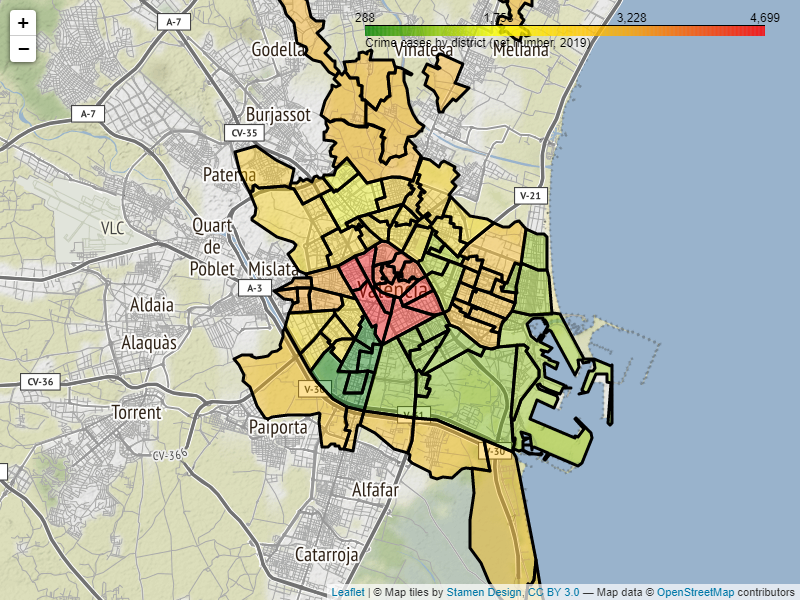

[Interactive map](valencia_dis_crime.html)

In [39]:
filename="valencia_dis_crime"
colormap_field = 'dis_crime'
colormap_colors=['green','yellow','orange','red']
map_caption="Crime cases by district (net number, 2019)"
map_fields=['Neighborhood','District', 'dis_crime']
map_aliases=['Neighborhood: ','District: ', 'District crime cases: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

For a proper analysis we will transform this crime by district data dividing it by the population. We will distribute district crime it among the population foreach neighborhood it contains. Doing so we will obtain crime per capita per neighborhod.

In [40]:
district_pop = gdf_val.groupby("District").Population.sum()
for idx in gdf_val.index:
    gdf_val.loc[idx,"nei_crime"]=gdf_val.loc[idx,"Population"]/district_pop.loc[gdf_val.loc[idx,"District"]]*gdf_val.loc[idx,"dis_crime"]

And then we visualize it:

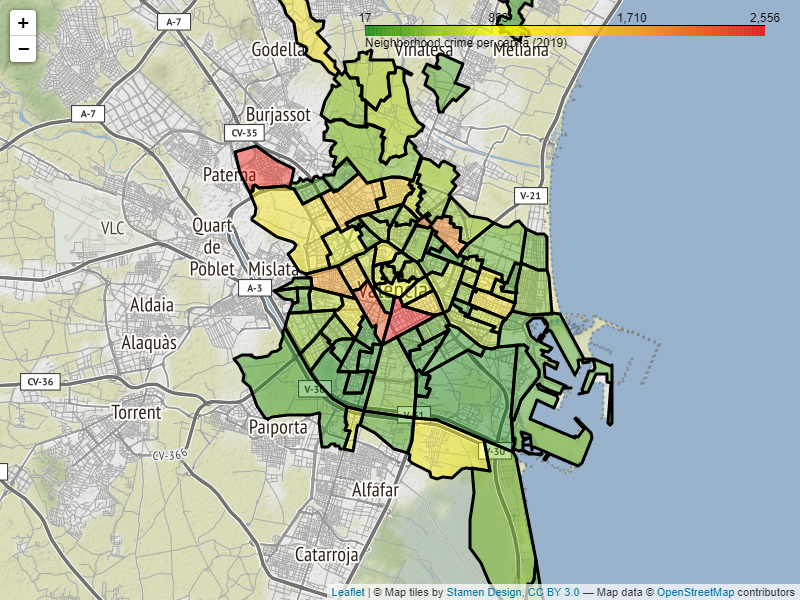

[Interactive map](valencia_nei_crime.html)

In [41]:
filename="valencia_nei_crime"
colormap_field = 'nei_crime'
colormap_colors=['green','yellow','orange','red']
map_caption="Neighborhood crime per capita (2019)"
map_fields=['Neighborhood','District', 'nei_crime']
map_aliases=['Neighborhood: ','District: ', 'Neighborhood crime per capita: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

Making this data transformation we see an smoother distribution of crimes among population. A big contrast can be seen at the central part of the city, where the number of inhabitants is significantly bigger. 

We can see that the crime is distributed with higher intensity from the center to northwest of the city, where there is a very large influx of people (inhabitants of the city and also tourists). Notice that at NW of the city, at Benimamet neighborhood, we found an outlier with high density of crimes.

Overall, Spain is a very safe country compared with even other European countries, scoring as the 34th safest country in the world according to [Numbeo Crime Index by Country for the year 2020](https://www.numbeo.com/crime/rankings_by_country.jsp).

## Amenities data

The number of venues in each neighborhood and district will be taken from Foursquare using their API. This data will be used as a proxy of economic activity in each neighborhood.

The data obtained will be combined for all neighborhoods (using information on a district level where neighborhood level is not available, such as crime and income) and the data set will be fed to a K-means algorithm to segment the neighborhoods. The insights obtained will be discussed in the final report.

This is the information needed to access the data via Foursquare API:

In [42]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
ACCESS_TOKEN = '' # your Foursquare Access Token
VERSION = '20180605' # Foursquare API version
LIMIT = 14*14 #Query limit

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 
CLIENT_SECRET:


Two functions to get the category type of the venues extracted from foursquare data will be created:

In [43]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [44]:
def getNearbyVenues(names, latlong, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latlong.str[0], latlong.str[1]):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        print(str(len(results))+"\n")
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Let us generate the data for the neighborhoods of Valencia.

In [45]:
amenities_path='.\\data\\amenities\\amenities.xlsx'

# Snipet for getting all the data from Foursquare and saving it to a file
# df_val_ven = getNearbyVenues(names=gdf_val['Neighborhood'],
#                              latlong=gdf_val['nei_latlong'],
#                              radius=750
#                              )
# df_val_ven.to_excel(amenities_path)
df_val_ven= pd.read_excel(amenities_path, index_col=0)

In [46]:
print(df_val_ven.shape)
df_val_ven.head(3)

(3958, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,La Seu,39.47662,-0.375118,Colmado Lalola,39.475241,-0.375624,Tapas Restaurant
1,La Seu,39.47662,-0.375118,Crudo Bar,39.475043,-0.376202,Seafood Restaurant
2,La Seu,39.47662,-0.375118,San Tommaso,39.475282,-0.377144,Italian Restaurant


We will extract the data from the Foursquare data frame in order to collect the 10 most common venues in each neighborhood. Then that data will be examined to search for indicators of economic activity to add to the main dataframe.

In [47]:
# one hot encoding
valencia_clas = pd.get_dummies(df_val_ven[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
valencia_clas['Neighborhood'] = df_val_ven['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = ['Neighborhood'] + (valencia_clas.columns.drop('Neighborhood').tolist())
valencia_clas = valencia_clas[fixed_columns]

valencia_clas.head()

,Neighborhood,Accessories Store,American Restaurant,Aquarium,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,...,Trail,Train Station,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Wine Bar,Wine Shop,Winery,Women's Store
0,La Seu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,La Seu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,La Seu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,La Seu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,La Seu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


The venues will be grouped by neighborhood so we have the percentage of venues of a certain type for each neighborhood.

In [48]:
val_clas_grouped = valencia_clas.groupby('Neighborhood').sum().reset_index()
val_clas_grouped.head()

,Neighborhood,Accessories Store,American Restaurant,Aquarium,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,...,Trail,Train Station,Turkish Restaurant,Udon Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Wine Bar,Wine Shop,Winery,Women's Store
0,Aiora,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
1,Albors,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
2,Arrancapins,0,0,0,0,1,0,1,0,0,...,0,2,0,0,0,1,0,0,0,0
3,Benicalap,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Benifaraig,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


What are the 10 most common venues in each neighborhood? We can use this code to see that.

In [49]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [50]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
df_val_venues_sorted = pd.DataFrame(columns=columns)
df_val_venues_sorted['Neighborhood'] = val_clas_grouped['Neighborhood']

for ind in np.arange(val_clas_grouped.shape[0]):
    df_val_venues_sorted.iloc[ind, 1:] = return_most_common_venues(val_clas_grouped.iloc[ind, :], num_top_venues)

df_val_venues_sorted.sample(10)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
19,Ciutat Jardi,Spanish Restaurant,Bar,Pub,Café,Tapas Restaurant,Italian Restaurant,Pizza Place,Grocery Store,Sandwich Place,Cocktail Bar
53,La Seu,Tapas Restaurant,Mediterranean Restaurant,Spanish Restaurant,Ice Cream Shop,Italian Restaurant,Hotel,Vegetarian / Vegan Restaurant,Coffee Shop,Plaza,Park
74,Safranar,Spanish Restaurant,Grocery Store,Pizza Place,Fast Food Restaurant,Supermarket,Pub,Coffee Shop,Food,Nightclub,Beer Garden
22,El Calvari,Grocery Store,Asian Restaurant,Light Rail Station,Chinese Restaurant,Pizza Place,Supermarket,Clothing Store,Bistro,Farmers Market,Restaurant
13,Cami Real,Restaurant,Spanish Restaurant,Soccer Field,Grocery Store,Chinese Restaurant,Gas Station,Garden,Brewery,Performing Arts Venue,Soccer Stadium
41,La Carrasca,Tapas Restaurant,Supermarket,College Cafeteria,Café,Coffee Shop,German Restaurant,Paella Restaurant,Beer Garden,Beer Bar,Salad Place
11,Cami De Vera,Tapas Restaurant,Bar,College Cafeteria,Plaza,Spanish Restaurant,Fast Food Restaurant,Supermarket,Café,Chinese Restaurant,Mexican Restaurant
72,Poble Nou,Restaurant,Accessories Store,Other Great Outdoors,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Venue
34,Exposicio,Spanish Restaurant,Hotel,Bakery,Garden,Plaza,Restaurant,Grocery Store,Park,Breakfast Spot,Italian Restaurant
54,La Torre,Soccer Stadium,Grocery Store,BBQ Joint,Bakery,Accessories Store,Other Great Outdoors,Motel,Motorcycle Shop,Movie Theater,Moving Target


<a id='socioeconomic'></a>
It seems that a lot of venues are different kinds of restaurants. There is evidence that restaurants can be used as a proxy of socioeconomic activities in a neighborhood in absence of other data (the study can be seen [here](https://www.pnas.org/content/116/31/15447) "Predicting neighborhoods’ socioeconomic attributes using restaurant data" by Lei Dong, Carlo Ratti, and Siqi Zheng. PNAS July 30, 2019 116 (31) 15447-15452.

Let us collect the number of restaurants per neighborhood from the Foursquare data. And then add this information to the main dataframe.

In [51]:
res_cols = [col for col in val_clas_grouped.columns if 'Res' in col]

val_rest=pd.DataFrame()

val_rest['Neighborhood']=df_val_venues_sorted['Neighborhood']
val_rest['Restaurants']=val_clas_grouped[res_cols].sum(axis=1)

val_rest.head(3)

,Neighborhood,Restaurants
0,Aiora,16
1,Albors,40
2,Arrancapins,30


In [52]:
gdf_val = gdf_val.merge(val_rest, left_on='Neighborhood', right_on='Neighborhood')
gdf_val.head()

,geometry,dis_code,District,dis_latlong,dis_surface (km2),nei_code,Neighborhood,nei_latlong,nei_surface (km2),Population,pop_density,Income,Sale,Rent,dis_crime,nei_crime,Restaurants
0,"POLYGON ((726163.528 4373035.591, 726075.966 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,1,La Seu,"(39.476620409693346, -0.37511846544831134)",0.220972,2904,13141.953790,24774.0,3026.0,11.4,4159.282161,457.382437,42
1,"POLYGON ((726163.528 4373035.591, 726235.403 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,2,La Xerea,"(39.47414298122276, -0.3709325029155637)",0.311504,3829,12291.987765,23147.0,3201.0,10.0,4159.282161,603.070713,38
2,"POLYGON ((725246.846 4373567.091, 725317.721 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,3,El Carme,"(39.47904422076863, -0.3799855467196847)",0.383891,6292,16390.053138,26148.0,2367.0,10.0,4159.282161,990.995280,46
3,"POLYGON ((725259.778 4372900.595, 725267.966 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,4,El Pilar,"(39.47324432476664, -0.3822881406180378)",0.161533,4562,28241.960495,25461.0,2228.0,10.2,4159.282161,718.518828,44
4,"POLYGON ((725427.278 4372941.094, 725428.841 4...",1,CIUTAT VELLA,"(39.47441536841218, -0.3767595980825815)",1.689072,5,El Mercat,"(39.47383027710339, -0.3788324835659759)",0.172716,3413,19760.751645,27057.0,2506.0,11.1,4159.282161,537.550364,44


Lets create a colormap for the Neighborhoods representing this metric:

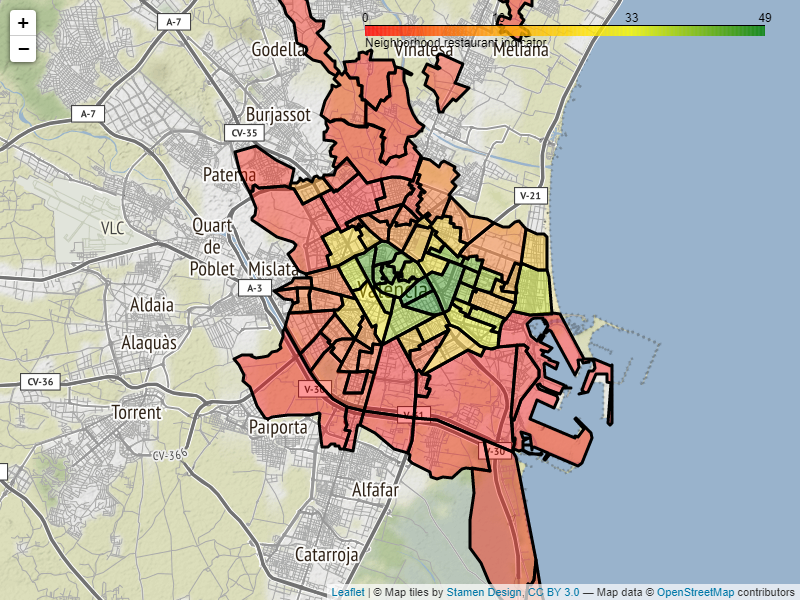

[Interactive map](valencia_res.html)

In [53]:
filename="valencia_res"
colormap_field = 'Restaurants'
colormap_colors=['red','orange','yellow','green']
map_caption="Neighborhood restaurant indicator"
map_fields=['Neighborhood','District', 'Restaurants']
map_aliases=['Neighborhood: ','District: ', 'Restaurants: ']

dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)

if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

## Correlation

Once we reach this point, where all the data is correctly extracted, transformed and loaded, we can create an show the correlation matrix among this metrics in order to check their relationship.

In [54]:
cor_val = gdf_val[['Income',  'Restaurants', 'Sale', 'Rent', 'pop_density', 'nei_crime']]
cor_val.reset_index(drop=True, inplace=True)
cor_val.columns=['Gross Income per capita', 'Restaurants indicator', 'Sale price per m²',  'Rent price per m²', 'Population density', 'Crime per capita']
# cor_val.set_index('Neighborhood', drop=True)
corr = cor_val.corr()
corr

,Gross Income per capita,Restaurants indicator,Sale price per m²,Rent price per m²,Population density,Crime per capita
Gross Income per capita,1.000000,0.558635,0.585312,0.394309,0.084043,0.179211
Restaurants indicator,0.558635,1.000000,0.631820,0.476504,0.366757,0.240465
Sale price per m²,0.585312,0.631820,1.000000,0.743627,-0.191675,0.211579
Rent price per m²,0.394309,0.476504,0.743627,1.000000,-0.288353,0.126165
Population density,0.084043,0.366757,-0.191675,-0.288353,1.000000,0.250908
Crime per capita,0.179211,0.240465,0.211579,0.126165,0.250908,1.000000


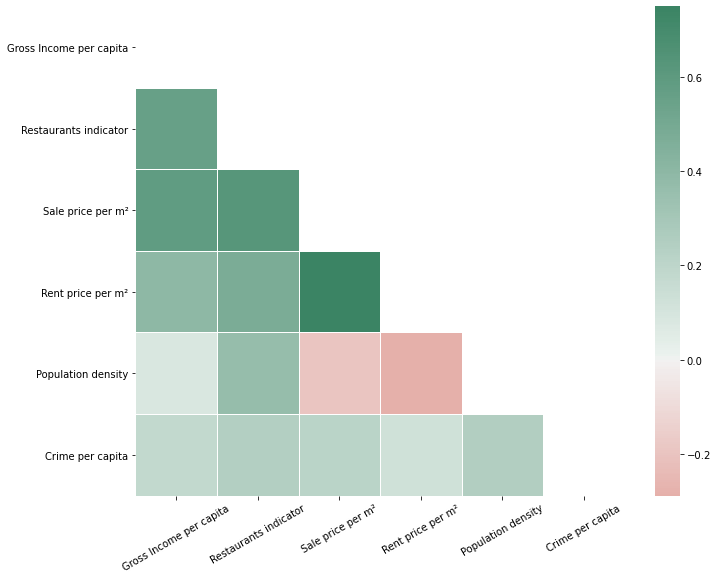

In [55]:
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
fig, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(15, 150,as_cmap=True,)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.75, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": 1})
ax.set_xticklabels(ax.get_xticklabels(),rotation=30) 
fig.savefig('correlation.png',dpi=300)

It is obvious that the principal correlation is between Sale and Rent prices, most expensive real state for buying is also expensive for renting. As commented [here](#socioeconomic), we find a correlation between amenities (Restaurant indicator) with gross income per capita. Also, this two indicators have a positive correlation with sales and renting prices. Richer people live in expensive areas where usually have more commodities. It's interesting that the population density is no so correlated with the gross income data, but it is inversely correlated with sale and rent prices per square meter: expensive areas are less populated than the cheap ones. However, there is a correlation between population density and the restaurants indicator: more people in the area need more restaurants in the area.

We notice also that the crime per capita indicator has no great correlation with any of the other indicators. This means that crime is smoothly distributed among Valencia neighborhoods.

# Modeling

With all the information we have we will perform a segmentation of the neighborhoods using a K-means clustering algorithm. We will modify our main dataframe with the information from val_clas_grouped to feed the algorithm.

In [56]:
val_clustering = gdf_val[['Income', 'Sale',
                            'Rent', 'pop_density',
                            'nei_crime','Restaurants']]
val_clustering.head()

,Income,Sale,Rent,pop_density,nei_crime,Restaurants
0,24774.0,3026.0,11.4,13141.953790,457.382437,42
1,23147.0,3201.0,10.0,12291.987765,603.070713,38
2,26148.0,2367.0,10.0,16390.053138,990.995280,46
3,25461.0,2228.0,10.2,28241.960495,718.518828,44
4,27057.0,2506.0,11.1,19760.751645,537.550364,44


Lets transform some columns of the dataframe in order to show better the desirable characteristics of neighborhoods. This step is not necessary, Is just for make personally more coherent.

In [57]:
val_clustering["Sale"] = 1/val_clustering["Sale"]
val_clustering["Rent"] = 1/val_clustering["Rent"]
val_clustering["pop_density"] = 1/val_clustering["pop_density"]
val_clustering["nei_crime"] = 1/val_clustering["nei_crime"]
val_clustering.head()

,Income,Sale,Rent,pop_density,nei_crime,Restaurants
0,24774.0,0.000330,0.087719,0.000076,0.002186,42
1,23147.0,0.000312,0.100000,0.000081,0.001658,38
2,26148.0,0.000422,0.100000,0.000061,0.001009,46
3,25461.0,0.000449,0.098039,0.000035,0.001392,44
4,27057.0,0.000399,0.090090,0.000051,0.001860,44


We need to determine the optimal number of clusters for the algorithm. To do this, the elbow method will be used. For each k value, k-means will be initialized, and the inertia attribute will be employed to identify the sum of squared distances of samples to the nearest cluster center.

First, we need to normalize the data:

In [58]:
X=preprocessing.MinMaxScaler().fit(val_clustering).transform(val_clustering)

In [59]:
Sum_squared_distances = []
K = range(1,16)
for k in K:
    km = KMeans(n_clusters=k,init='k-means++')
    km = km.fit(X)
    Sum_squared_distances.append(km.inertia_)

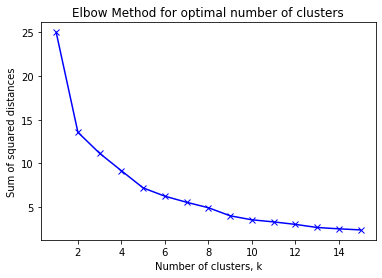

In [60]:
plt.plot(K, Sum_squared_distances, 'bx-')
plt.xlabel('Number of clusters, k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method for optimal number of clusters')
plt.savefig('elbow.png',dpi=300)
plt.show()

The optimal number of clusters, according to the elbow method, is 5.

In [61]:
# set number of clusters
kclusters = 5                          
                             
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters,init='k-means++').fit(X)

In [62]:
# add clustering labels

gdf_val.insert(0, 'Cluster Labels', kmeans.labels_)
# gdf_val.head()

In [63]:
#Function for the color code of the map
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

Now we can show the segmentation of the neighborhoods on the map:

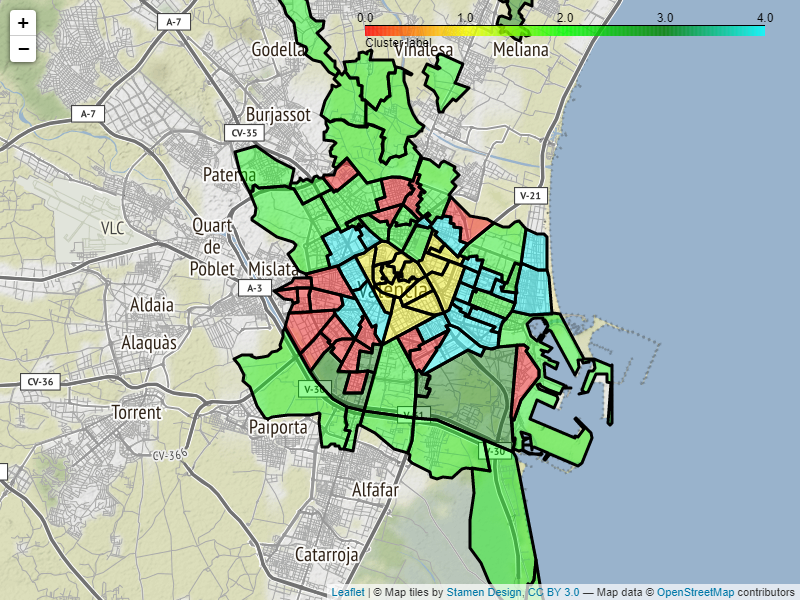

[Interactive map](valencia_clu.html)

In [64]:
filename="valencia_clu"
colormap_field = 'Cluster Labels'
colormap_colors=["red",  "yellow" ,"lime", "green", "cyan"]
map_caption="Cluster label"
map_fields=['Neighborhood','District', 'Cluster Labels']
map_aliases=['Neighborhood: ','District: ', 'Cluster Labels: ']


dummymap = create_map(filename,colormap_field, colormap_colors, map_caption, map_fields, map_aliases)
if SHOWMAPS == True:
    display(dummymap)
else:
    im = Image(filename+".png")
    display(im)
    
md('[Interactive map]({0})'.format(GHURL+filename+".html"))

In [65]:
gdf_val.to_excel('.\\data\\valencia_ETL.xlsx')

# Evaluation
Let us take a look at the different features employed in the algorithm in form of box plots to see how they are segmented:

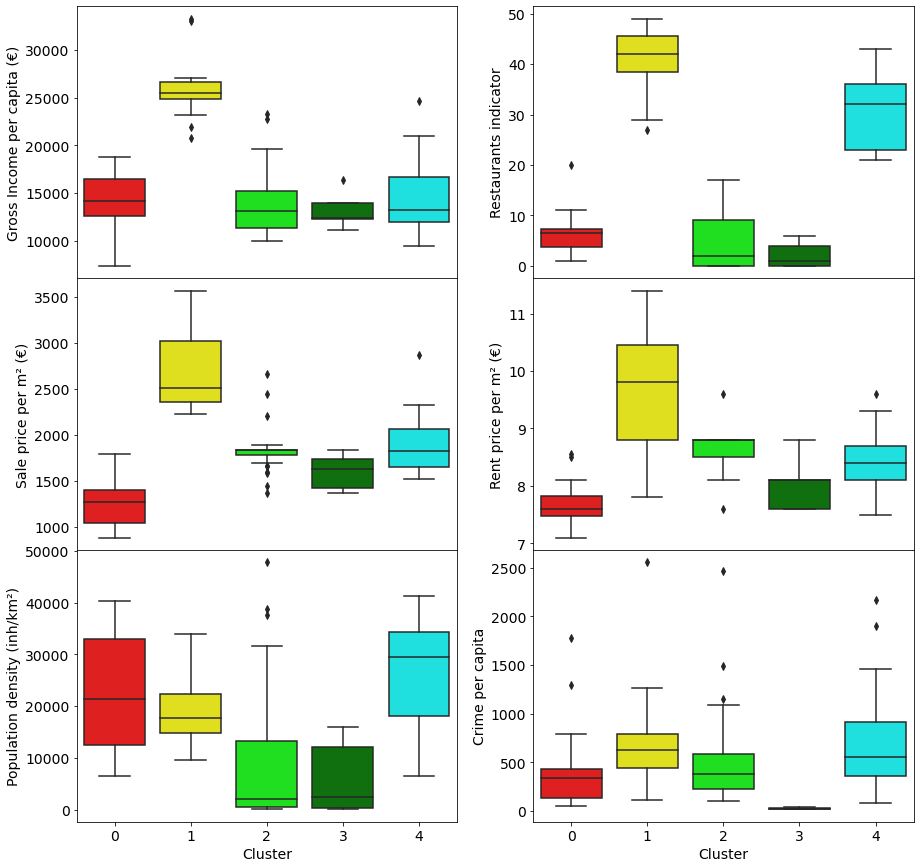

In [66]:
my_pal = dict(zip(range(len(colormap_colors)),colormap_colors))
indicators_labels = {'Income':'Gross Income per capita (€)',
                     'Restaurants':'Restaurants indicator',
                     'Sale':'Sale price per m² (€)',
                     'Rent':'Rent price per m² (€)',
                     'pop_density':'Population density (inh/km²)',
                     'nei_crime':'Crime per capita'}

fig = plt.figure(figsize=(15,15), )
gs = fig.add_gridspec(nrows=3, ncols=2, hspace=0)
ax = gs.subplots(sharex=True,)



for indicator, axi in zip(indicators_labels.keys(), ax.ravel()):
    sub = sns.boxplot(data=gdf_val, x=gdf_val['Cluster Labels'], y=gdf_val[indicator], 
                ax=axi, palette=my_pal)
    sub.set_ylabel(indicators_labels[indicator], fontsize = 14.0)
    sub.set_xlabel("Cluster", fontsize = 14.0)
    sub.tick_params(axis='both', which='major', labelsize=14)
    
    
fig.savefig("combined_box.png",dpi=300)

We can obtain some insights from this analysis. The classification of the neighborhoods of Valencia would be as follows:

Neighborhoods in the first cluster represents regular outer neighborhoods, with the lowest prices on sale and rent and few commodities. This neighborhoods are heavy populated but safe.

Second cluster represent richer parts of the city, all among the city center. All neighborhoods it contains have the highest prices on sale and rent, thus, its population is the wealthier of the city. This clusters has an high quantity of commodities.

The third cluster is composed only by three neighborhoods, and is defined by the lower density/crime among all. This is due to that those neighborhoods are almost vast green areas.

In the forth cluster represents the second richer parts of the city. Although income per capita and sale/rent prices are in the mean values, this cluster has many commodities and it is heavy populated, We can state that people living in this cluster is most conformed by the middle class of Valencia inhabitants.

The fifth cluster show lower class neighborhoods, with few amenities. Notice that the median rent in this neighborhoods is higher than the sale. Provably it is due to that most of people there are not landlords but renters.

# Conclusion
The main goal of this project was to classify the neighborhoods of Valencia based on socioeconomic and business diversity in order to give information about living conditions in Valencia to new employees of our client to narrow down their housing search after they are hired to work there.

To do that, information about population density, income levels, crime levels, real estate information (renting and buying prices), and amenities in the neighborhood were collected from several official government bodies, such as the spanish national statistics institute and the city council of Valencia and from business data from Foursquare. 

The data was converted to a data frame which was normalized and fed to a K Means clustering algorithm that segmented the neighborhoods in the optimal number of clusters using the elbow method, which was three clusters.

Finally, the clusters were examined to search common features for the neighborhoods, as shown in the previous section. Final selection of living arrangements will be performed by our client's new employees based on specific features of the clusters.

# Future work
Although we deep inside many metrics for this work there are many lines that can be pushed further. Find some of then proposed below:

* Historical data for analysis:
  * A derivative can be perform on the time series of the indicators, thus the momentum of its evolution can help to predicted the tendencies
* Selection of neighborhoods by assign a custom weight on the indicators:
  * By this manner, reader could select the ones more interesting to him by, for example, minimize the crime and sale prices and maximize the commodities
* Custom [POI](https://en.wikipedia.org/wiki/Point_of_interest)s to improve the segmentation
  * Adding a POI and explore new segmentations minimizing the distance to it

In [67]:
# To export this notebook as pdf using latex:
# jupyter nbconvert --to pdf --no-input Example.ipynb 